
# Analyze the results of training on unmasked CTX images

Here we do some preliminary analysis on the trained model results. This analyzes 48 model trainings and applications from the Saha algorithm. Instructions to download the results are found in the Download_Results notebook

In [2]:
import pandas as pd
import os
import numpy as np
from scipy.optimize import linear_sum_assignment
import rioxarray as rxr
from PIL import Image
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import linkage, fcluster
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from scipy.stats import mode
import geopandas as gpd

### Useful functions for displaying images in the right colors

In [3]:
### COLORS
palette = {0 : (255, 255, 255), # Impervious surfaces (white)
           1 : (0, 0, 255),     # Buildings (blue)
           2 : (0, 255, 255),   # Low vegetation (cyan)
           3 : (0, 255, 0),     # Trees (green)
           4 : (255, 255, 0),   # Cars (yellow)
           5 : (255, 0, 0),     # Clutter/background (red)
           6 : (255, 0, 255),   # (pink)
           7 : (0, 0, 0)}       # Undefined (black)

invert_palette = {v: k for k, v in palette.items()}

def convert_from_color(arr_3d, palette=invert_palette):
    """ RGB-color encoding to grayscale labels """
    arr_2d = np.zeros((arr_3d.shape[0], arr_3d.shape[1]), dtype=np.uint8)

    for c, i in palette.items():
        #print(c)
        #print(i)
        m = np.all(arr_3d == np.array(c).reshape(1, 1, 3), axis=2)
        arr_2d[m] = i

    return arr_2d

def convert_to_color(arr_2d, palette=palette):
    """ Numeric labels to RGB-color encoding """
    arr_3d = np.zeros((arr_2d.shape[0], arr_2d.shape[1], 3), dtype=np.uint8)

    for c, i in palette.items():
        m = arr_2d == c
        arr_3d[m] = i

    return arr_3d


## Algorithm to do feature correspondence and calculate the overlap

In [5]:
def simple_overlap(pred,gt,plotting=False):
    
    LF0 = pred[gt == 0]
    LF1 = pred[gt == 1]
    LF2 = pred[gt == 2]
    LF3 = pred[gt == 3]
    LF4 = pred[gt == 4]

    cluster_num = len(np.unique(pred))
    totals = np.zeros((cluster_num,5))
    feature_map = np.zeros(cluster_num)
    # print(cluster_num)
    mapped = pred.copy()
    mapped_static = pred.copy()
    for i in range(cluster_num):
        totals[i,0] = np.sum(LF0 == i)
        totals[i,1] = np.sum(LF1 == i)
        totals[i,2] = np.sum(LF2 == i)
        totals[i,3] = np.sum(LF3 == i)
        totals[i,4] = np.sum(LF4 == i)
        feature_map[i] = [k for k, x in enumerate(totals[i,:] == np.max(totals[i,:])) if x][0]
        # print("Loop: ", i, "Feature Map: ", feature_map[i])
        mapped[mapped_static == i] = feature_map[i]

    valid_mask = ~np.isnan(pred)
    pred_nonan_flat = pred[valid_mask].ravel()
    gt_nonan_flat = gt[valid_mask].ravel()

    f1 = f1_score(gt_nonan_flat, pred_nonan_flat, average='weighted', zero_division=0)
    print(f'F1 Score: {f1:.4f}')

    if plotting:
        # Create a figure with subplots
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))

        plot_vmin = 0
        plot_vmax_pred = np.nanmax(np.unique(pred))
        plot_vmax_gt = np.nanmax(np.unique(gt))

        # Plot the clustered image
        axes[0].imshow(pred, cmap='jet', vmin=plot_vmin, vmax=plot_vmax_pred)
        axes[0].set_title('Clustered Image')
        axes[0].axis('off')

        # Plot the ground truth image
        axes[1].imshow(gt, cmap='jet', vmin=plot_vmin, vmax=plot_vmax_gt)
        axes[1].set_title('Ground Truth Image')
        axes[1].axis('off')

        # Plot the mapped image
        axes[2].imshow(mapped, cmap='jet', vmin=plot_vmin, vmax=plot_vmax_gt)
        axes[2].set_title('Mapped Image')
        axes[2].axis('off')
    
    return mapped, feature_map, f1

## Load in the results

Here we have to parse the filenames to extract the hyperparameters used in each training.

In [6]:
# Directory containing the files
directory = '/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/results/CTX_only/images'

# Get list of filenames in the directory
filenames = [f for f in os.listdir(directory) if os.path.isfile(os.path.join(directory, f))]

# Initialize lists to store data
ctxIMG = []
ctxDEM = []
ctxSLOPE = []
ff = []
ps = []
mask = []
filename_list = []

# Process each filename
for filename in filenames:
    ctxIMG.append(1 if 'ctxIMG' in filename else 0)
    ctxDEM.append(1 if 'ctxDEM' in filename else 0)
    ctxSLOPE.append(1 if 'ctxSLOPE' in filename else 0)
    mask.append(1 if 'mask' in filename else 0)
    
    ff_value = filename.split('_ff')[1].split('_')[0]
    ps_value = filename.split('_ps')[1].split('.')[0]
    
    ff.append(int(ff_value))
    ps.append(int(ps_value))
    filename_list.append(filename)

# Create DataFrame
df = pd.DataFrame({
    'filename': filename_list,
    'mask': mask,
    'ctxIMG': ctxIMG,
    'ctxDEM': ctxDEM,
    'ctxSLOPE': ctxSLOPE,
    'ff': ff,
    'ps': ps
})

# Add empty columns to the dataframe
df['LM2_f1'] = np.nan
df['LM3_f1'] = np.nan
df['LM4_f1'] = np.nan
df['LM2_f1_mask'] = np.nan
df['LM3_f1_mask'] = np.nan
df['LM4_f1_mask'] = np.nan
# df['LM2_feature_map'] = np.nan
# df['LM3_feature_map'] = np.nan
# df['LM4_feature_map'] = np.nan
# df['LM2_feature_map_mask'] = np.nan
# df['LM3_feature_map_mask'] = np.nan
# df['LM4_feature_map_mask'] = np.nan

print(df.shape)
df.head()

(48, 13)


,filename,mask,ctxIMG,ctxDEM,ctxSLOPE,ff,ps,LM2_f1,LM3_f1,LM4_f1,LM2_f1_mask,LM3_f1_mask,LM4_f1_mask
0,ctxIMG_ctxDEM_ff4_ps448.png,0,1,1,0,4,448,NaN,NaN,NaN,NaN,NaN,NaN
1,ctxIMG_ctxDEM_ff6_ps224.png,0,1,1,0,6,224,NaN,NaN,NaN,NaN,NaN,NaN
2,ctxIMG_ctxDEM_ctxSLOPE_ff10_ps336.png,0,1,1,1,10,336,NaN,NaN,NaN,NaN,NaN,NaN
3,ctxDEM_ctxSLOPE_ff4_ps448.png,0,0,1,1,4,448,NaN,NaN,NaN,NaN,NaN,NaN
4,ctxIMG_ctxDEM_ctxSLOPE_ff8_ps448.png,0,1,1,1,8,448,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
data_path = "/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/data/ai_ready_masked/" # This is an example, change it to your own path
ctxIMG_masked = rxr.open_rasterio(data_path + "ctxIMG_aiready_masked.tif", cache=False)
masked_vals = ctxIMG_masked.values[0,:,:]

LM_file2 = Image.open("/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/data/label/validation_map_2.tif")
LM_file3 = Image.open("/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/data/label/validation_map_3.tif")
LM_file4 = Image.open("/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/data/label/validation_map_4.tif")

LM2 = np.array(LM_file2)
LM3 = np.array(LM_file3)
LM4 = np.array(LM_file4)

LM2_masked = LM2.astype(float).copy()
LM2_masked[masked_vals == 0] = np.nan

LM3_masked = LM3.astype(float).copy()
LM3_masked[masked_vals == 0] = np.nan

LM4_masked = LM4.astype(float).copy()
LM4_masked[masked_vals == 0] = np.nan

for i in range(df.shape[0]):
    print(i)
    results_path = '/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/results/CTX_only/images/'
    predicted_file = Image.open(results_path + df["filename"].loc[i])
    predicted_color = np.array(predicted_file)
    predicted = convert_from_color(predicted_color[:,:,:-1])

    predicted_masked = predicted.astype(float).copy()
    predicted_masked[masked_vals == 0] = np.nan

    # LM2
    LM2_mapped_img, LM2_feature_map, LM2_f1 = simple_overlap(predicted, LM2)
    LM2_mapped_img_mask, LM2_feature_map_mask, LM2_f1_mask = simple_overlap(predicted_masked, LM2_masked)

    # LM3
    LM3_mapped_img, LM3_feature_map, LM3_f1 = simple_overlap(predicted, LM3)
    LM3_mapped_img_mask, LM3_feature_map_mask, LM3_f1_mask = simple_overlap(predicted_masked, LM3_masked)

    # LM4
    LM4_mapped_img, LM4_feature_map, LM4_f1 = simple_overlap(predicted, LM4)
    LM4_mapped_img_mask, LM4_feature_map_mask, LM4_f1_mask = simple_overlap(predicted_masked, LM4_masked)

    df.at[i, 'LM2_f1'] = LM2_f1
    df.at[i, 'LM3_f1'] = LM3_f1
    df.at[i, 'LM4_f1'] = LM4_f1
    df.at[i, 'LM2_f1_mask'] = LM2_f1_mask
    df.at[i, 'LM3_f1_mask'] = LM3_f1_mask
    df.at[i, 'LM4_f1_mask'] = LM4_f1_mask
    # df.at[i, 'LM2_feature_map'] = LM2_feature_map
    # df.at[i, 'LM3_feature_map'] = LM3_feature_map
    # df.at[i, 'LM4_feature_map'] = LM4_feature_map
    # df.at[i, 'LM2_feature_map_mask'] = LM2_feature_map_mask
    # df.at[i, 'LM3_feature_map_mask'] = LM3_feature_map_mask
    # df.at[i, 'LM4_feature_map_mask'] = LM4_feature_map_mask


0
F1 Score: 0.3796
F1 Score: 0.2222
F1 Score: 0.4562
F1 Score: 0.3575
F1 Score: 0.4182
F1 Score: 0.2979
1
F1 Score: 0.1306
F1 Score: 0.2625
F1 Score: 0.0489
F1 Score: 0.1045
F1 Score: 0.0543
F1 Score: 0.1157
2
F1 Score: 0.0614
F1 Score: 0.0464
F1 Score: 0.0815
F1 Score: 0.0801
F1 Score: 0.0846
F1 Score: 0.0855
3
F1 Score: 0.3453
F1 Score: 0.2324
F1 Score: 0.2855
F1 Score: 0.1335
F1 Score: 0.2842
F1 Score: 0.1317
4
F1 Score: 0.2497
F1 Score: 0.3034
F1 Score: 0.1518
F1 Score: 0.1311
F1 Score: 0.1531
F1 Score: 0.1335
5
F1 Score: 0.3066
F1 Score: 0.2129
F1 Score: 0.3229
F1 Score: 0.2497
F1 Score: 0.3357
F1 Score: 0.2664
6
F1 Score: 0.1591
F1 Score: 0.0210
F1 Score: 0.2481
F1 Score: 0.2134
F1 Score: 0.2680
F1 Score: 0.2627
7
F1 Score: 0.1194
F1 Score: 0.1696
F1 Score: 0.0888
F1 Score: 0.1165
F1 Score: 0.0828
F1 Score: 0.1066
8
F1 Score: 0.0886
F1 Score: 0.1659
F1 Score: 0.0688
F1 Score: 0.1320
F1 Score: 0.0734
F1 Score: 0.1358
9
F1 Score: 0.3555
F1 Score: 0.2151
F1 Score: 0.3547
F1 Score: 0

In [8]:
# List of f1 columns
f1_columns = ['LM2_f1', 'LM3_f1', 'LM4_f1', 'LM2_f1_mask', 'LM3_f1_mask', 'LM4_f1_mask']

# Get the entry with the highest value for each f1 column
highest_entries = df.loc[df[f1_columns].idxmax()]

highest_entries

,filename,mask,ctxIMG,ctxDEM,ctxSLOPE,ff,ps,LM2_f1,LM3_f1,LM4_f1,LM2_f1_mask,LM3_f1_mask,LM4_f1_mask
0,ctxIMG_ctxDEM_ff4_ps448.png,0,1,1,0,4,448,0.379609,0.456204,0.418212,0.222217,0.357468,0.297860
0,ctxIMG_ctxDEM_ff4_ps448.png,0,1,1,0,4,448,0.379609,0.456204,0.418212,0.222217,0.357468,0.297860
0,ctxIMG_ctxDEM_ff4_ps448.png,0,1,1,0,4,448,0.379609,0.456204,0.418212,0.222217,0.357468,0.297860
24,ctxIMG_ctxDEM_ctxSLOPE_ff8_ps224.png,0,1,1,1,8,224,0.256016,0.123032,0.125267,0.407396,0.163750,0.167538
0,ctxIMG_ctxDEM_ff4_ps448.png,0,1,1,0,4,448,0.379609,0.456204,0.418212,0.222217,0.357468,0.297860
23,ctxIMG_ctxDEM_ff6_ps448.png,0,1,1,0,6,448,0.208316,0.203810,0.215381,0.341706,0.346371,0.374989


## Display and analyze the top performers

F1 Score: 0.3796
F1 Score: 0.2222
F1 Score: 0.4562
F1 Score: 0.3575
F1 Score: 0.4182
F1 Score: 0.2979


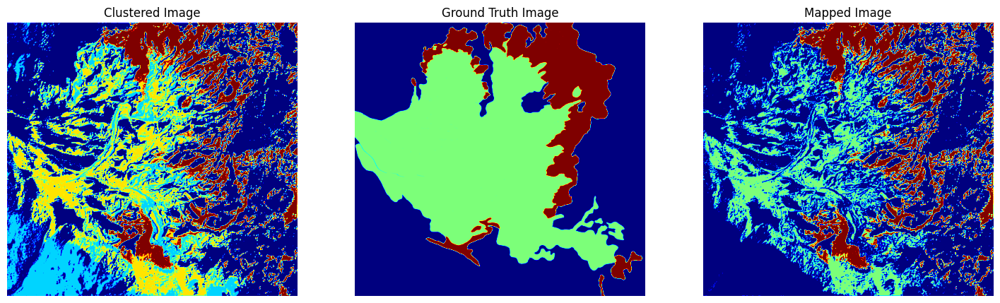

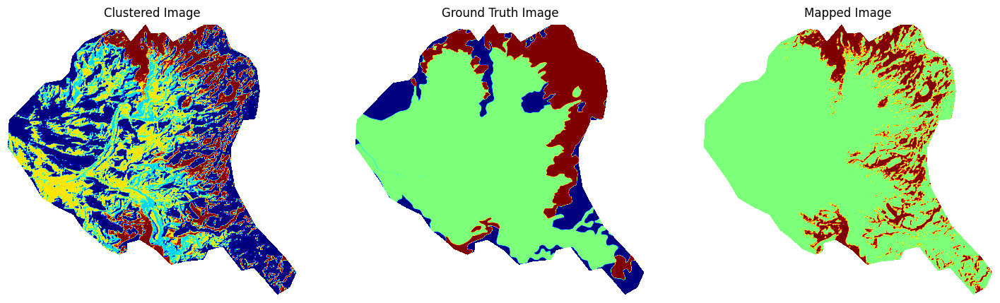

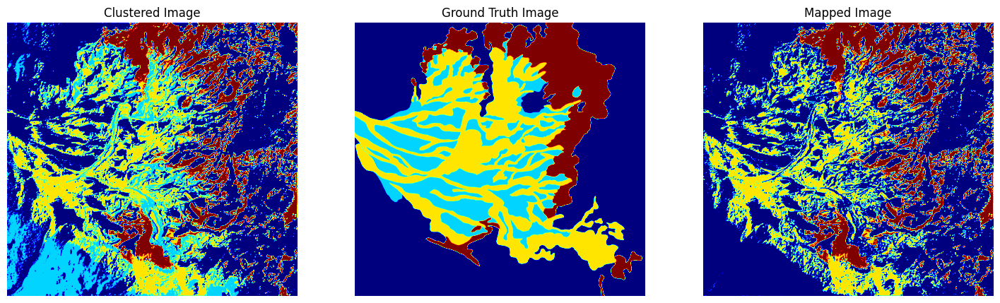

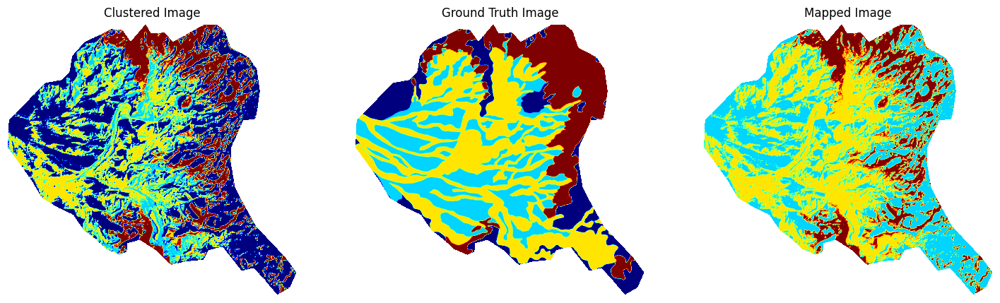

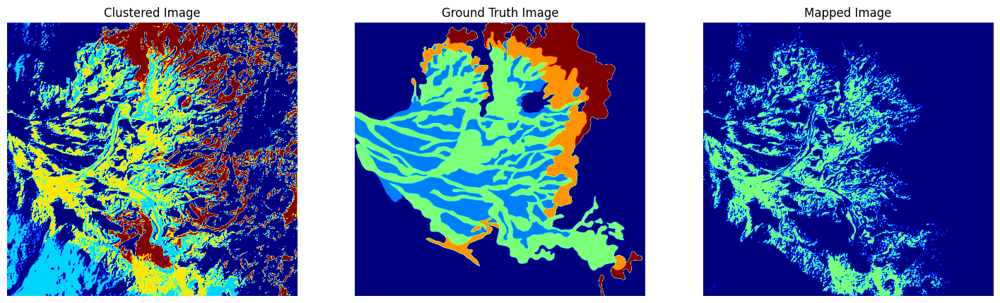

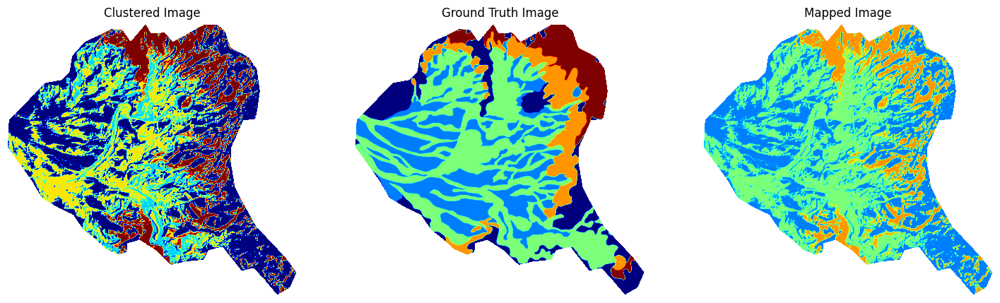

In [9]:
i = 0
results_path = '/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/results/CTX_only/images/'
predicted_file = Image.open(results_path + df["filename"].loc[i])
predicted_color = np.array(predicted_file)
predicted = convert_from_color(predicted_color[:,:,:-1])

predicted_masked = predicted.astype(float).copy()
predicted_masked[masked_vals == 0] = np.nan

# LM2
LM2_mapped_img, LM2_feature_map, LM2_f1 = simple_overlap(predicted, LM2, plotting=True)
LM2_mapped_img_mask, LM2_feature_map_mask, LM2_f1_mask = simple_overlap(predicted_masked, LM2_masked, plotting=True)

# LM3
LM3_mapped_img, LM3_feature_map, LM3_f1 = simple_overlap(predicted, LM3, plotting=True)
LM3_mapped_img_mask, LM3_feature_map_mask, LM3_f1_mask = simple_overlap(predicted_masked, LM3_masked, plotting=True)

# LM4
LM4_mapped_img, LM4_feature_map, LM4_f1 = simple_overlap(predicted, LM4, plotting=True)
LM4_mapped_img_mask, LM4_feature_map_mask, LM4_f1_mask = simple_overlap(predicted_masked, LM4_masked, plotting=True)

F1 Score: 0.2083
F1 Score: 0.3417
F1 Score: 0.2038
F1 Score: 0.3464
F1 Score: 0.2154
F1 Score: 0.3750


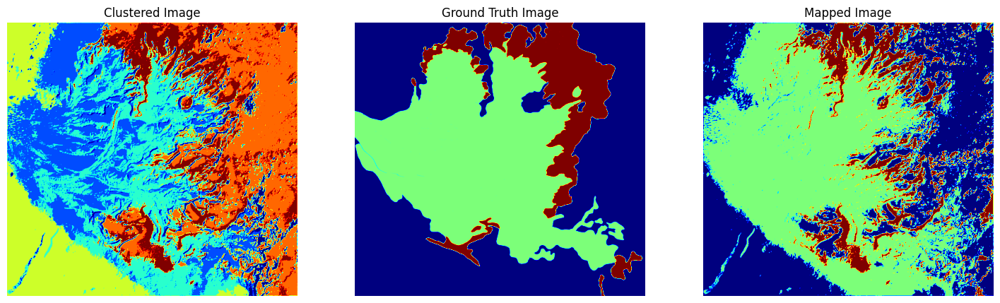

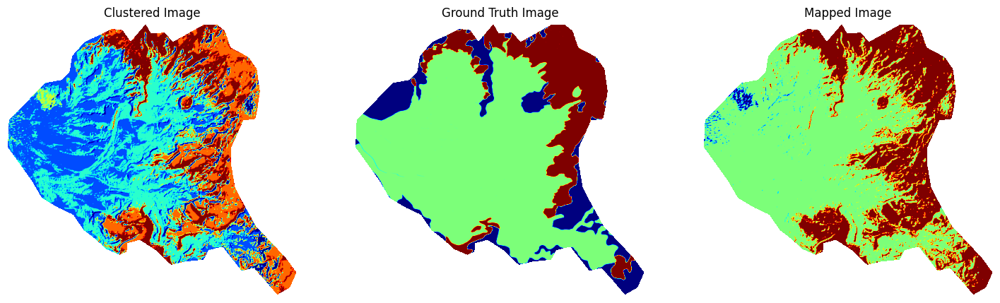

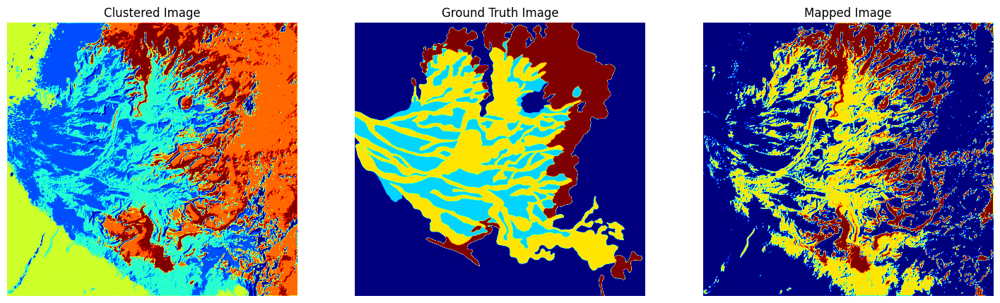

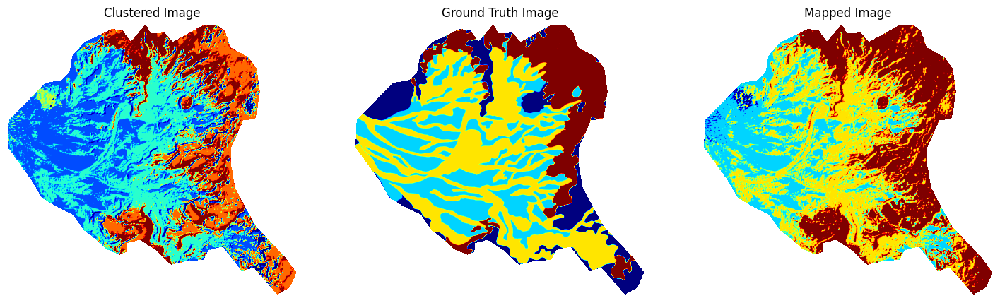

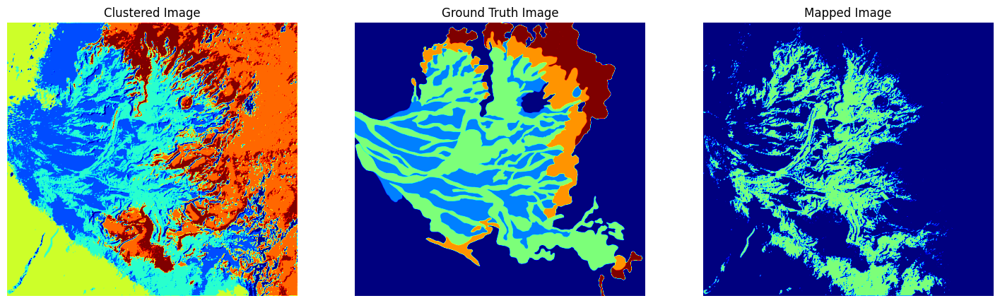

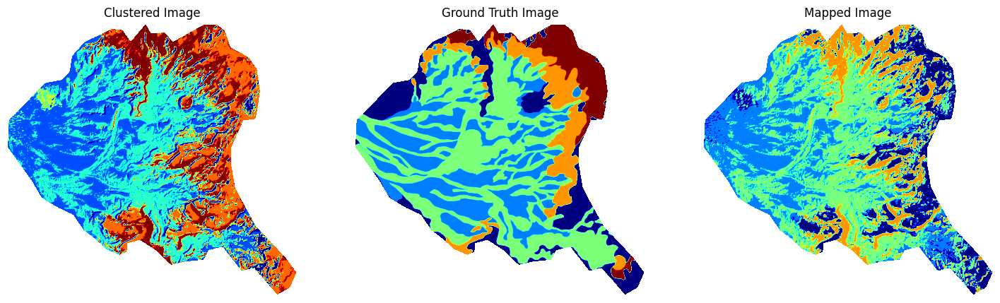

In [10]:
i = 23
results_path = '/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/results/CTX_only/images/'
predicted_file = Image.open(results_path + df["filename"].loc[i])
predicted_color = np.array(predicted_file)
predicted = convert_from_color(predicted_color[:,:,:-1])

predicted_masked = predicted.astype(float).copy()
predicted_masked[masked_vals == 0] = np.nan

# LM2
LM2_mapped_img, LM2_feature_map, LM2_f1 = simple_overlap(predicted, LM2, plotting=True)
LM2_mapped_img_mask, LM2_feature_map_mask, LM2_f1_mask = simple_overlap(predicted_masked, LM2_masked, plotting=True)

# LM3
LM3_mapped_img, LM3_feature_map, LM3_f1 = simple_overlap(predicted, LM3, plotting=True)
LM3_mapped_img_mask, LM3_feature_map_mask, LM3_f1_mask = simple_overlap(predicted_masked, LM3_masked, plotting=True)

# LM4
LM4_mapped_img, LM4_feature_map, LM4_f1 = simple_overlap(predicted, LM4, plotting=True)
LM4_mapped_img_mask, LM4_feature_map_mask, LM4_f1_mask = simple_overlap(predicted_masked, LM4_masked, plotting=True)

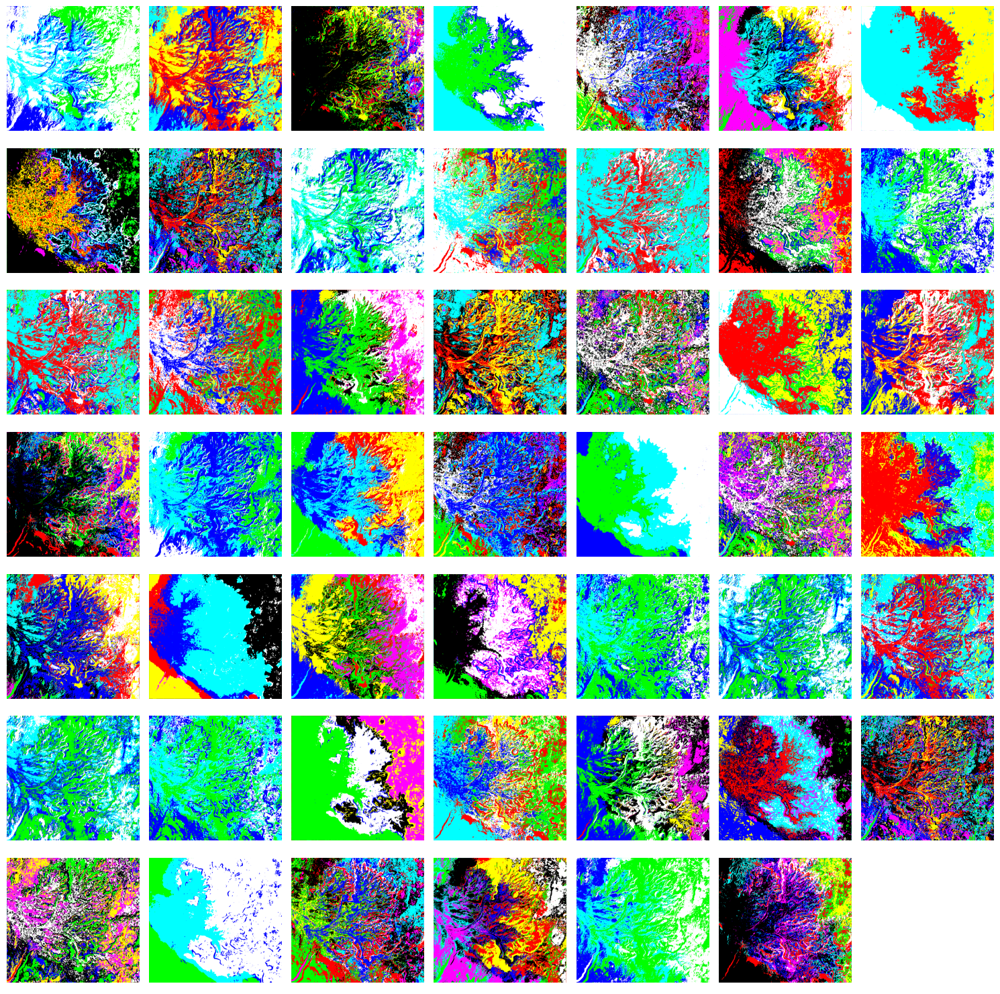

In [3]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# Directory containing the images
directory = '/Users/tthomas/Desktop/ESS569/MLGEO2024_MarsFans/results/CTX_only/images/'

# Get list of image filenames in the directory
filenames = [f for f in os.listdir(directory) if f.endswith('.png')]

# Determine the grid size (e.g., 3x3 grid)
grid_size = int(len(filenames) ** 0.5) + 1

# Create a figure with subplots
fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))

# Plot each image in the grid
for i, ax in enumerate(axes.flat):
    if i < len(filenames):
        # Open the image file
        img_path = os.path.join(directory, filenames[i])
        img = Image.open(img_path)
        
        # Display the image
        ax.imshow(img)
        # ax.set_title(filenames[i])
        ax.axis('off')
    else:
        # Hide any unused subplots
        ax.axis('off')

plt.tight_layout()
plt.show()